In [41]:
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib.pyplot import *
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression,Lasso,Ridge
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor

import warnings
warnings.filterwarnings('ignore')


In [42]:
Submission = pd.read_csv('M20_P13_Doctor_fee_consultationSample_submission.csv')
Train = pd.read_csv('M20_P13_Doctor_fee_consultationFinal_Train.csv')
Test = pd.read_csv('M20_P13_Doctor_fee_consultation_Final_Test.csv')
Train

,Qualification,Experience,Rating,Place,Profile,Miscellaneous_Info,Fees
0,"BHMS, MD - Homeopathy",24 years experience,100%,"Kakkanad, Ernakulam",Homeopath,"100% 16 Feedback Kakkanad, Ernakulam",100
1,"BAMS, MD - Ayurveda Medicine",12 years experience,98%,"Whitefield, Bangalore",Ayurveda,"98% 76 Feedback Whitefield, Bangalore",350
2,"MBBS, MS - Otorhinolaryngology",9 years experience,NaN,"Mathikere - BEL, Bangalore",ENT Specialist,NaN,300
3,"BSc - Zoology, BAMS",12 years experience,NaN,"Bannerghatta Road, Bangalore",Ayurveda,"Bannerghatta Road, Bangalore ₹250 Available on...",250
4,BAMS,20 years experience,100%,"Keelkattalai, Chennai",Ayurveda,"100% 4 Feedback Keelkattalai, Chennai",250
...,...,...,...,...,...,...,...
5956,"MBBS, MS - ENT",19 years experience,98%,"Basavanagudi, Bangalore",ENT Specialist,"98% 45 Feedback Basavanagudi, Bangalore",300
5957,MBBS,33 years experience,NaN,"Nungambakkam, Chennai",General Medicine,NaN,100
5958,MBBS,41 years experience,97%,"Greater Kailash Part 2, Delhi",General Medicine,"97% 11 Feedback Greater Kailash Part 2, Delhi",600
5959,"MBBS, MD - General Medicine",15 years experience,90%,"Vileparle West, Mumbai",General Medicine,General Medical Consultation Viral Fever Treat...,100


In [43]:
Test

,Qualification,Experience,Rating,Place,Profile,Miscellaneous_Info
0,MBBS,35 years experience,NaN,"Ghatkopar East, Mumbai",General Medicine,NaN
1,"MBBS, Diploma in Otorhinolaryngology (DLO)",31 years experience,NaN,"West Marredpally, Hyderabad",ENT Specialist,NaN
2,"MBBS, DDVL",40 years experience,70%,"KK Nagar, Chennai",Dermatologists,"70% 4 Feedback KK Nagar, Chennai"
3,BAMS,0 years experience,NaN,"New Ashok Nagar, Delhi",Ayurveda,NaN
4,"BDS, MDS - Conservative Dentistry & Endodontics",16 years experience,100%,"Kanakpura Road, Bangalore",Dentist,General Dentistry Conservative Dentistry Cosme...
...,...,...,...,...,...,...
1982,"BAMS, Doctor of Medicine",10 years experience,NaN,"Basavanagudi, Bangalore",Ayurveda,NaN
1983,"MD - Dermatology , Venereology & Leprosy, MBBS",4 years experience,NaN,"Choolai, Chennai",Dermatologists,NaN
1984,"MBBS, MD / MS - Obstetrics & Gynaecology",9 years experience,NaN,"Porur, Chennai",General Medicine,NaN
1985,BDS,12 years experience,98%,"Arekere, Bangalore",Dentist,RCT - Root Canal Treatment Root Canal Treatmen...


In [44]:
Submission

,Fees
0,1747
1,1725
2,2194
3,2193
4,2091
...,...
1982,2352
1983,1653
1984,2063
1985,2541


In [45]:
Train.describe()

,Fees
count,5961.000000
mean,307.944640
std,190.920373
min,5.000000
25%,150.000000
50%,300.000000
75%,500.000000
max,950.000000


In [46]:
Test.describe()

,Qualification,Experience,Rating,Place,Profile,Miscellaneous_Info
count,1987,1987,897,1981,1987,1153
unique,630,57,36,592,6,1084
top,BAMS,10 years experience,100%,"Andheri West, Mumbai",General Medicine,Acrylic Partial Denture Crowns and Bridges Fix...
freq,153,110,223,27,444,10


In [47]:
Train.isnull().sum()

Qualification            0
Experience               0
Rating                3302
Place                   25
Profile                  0
Miscellaneous_Info    2620
Fees                     0
dtype: int64

In [48]:
Test.isnull().sum()

Qualification            0
Experience               0
Rating                1090
Place                    6
Profile                  0
Miscellaneous_Info     834
dtype: int64

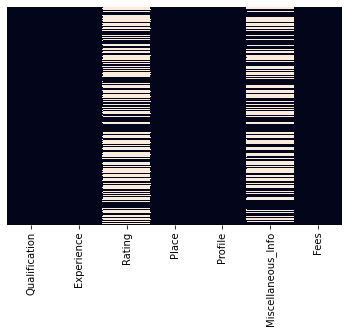

In [49]:
sns.heatmap(Train.isnull(),yticklabels=False,cbar=False)

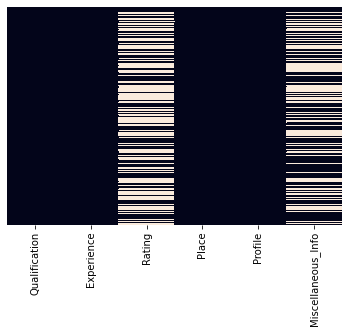

In [50]:
sns.heatmap(Test.isnull(),yticklabels=False,cbar=False)

In [51]:
Train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5961 entries, 0 to 5960
Data columns (total 7 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Qualification       5961 non-null   object
 1   Experience          5961 non-null   object
 2   Rating              2659 non-null   object
 3   Place               5936 non-null   object
 4   Profile             5961 non-null   object
 5   Miscellaneous_Info  3341 non-null   object
 6   Fees                5961 non-null   int64 
dtypes: int64(1), object(6)
memory usage: 326.1+ KB


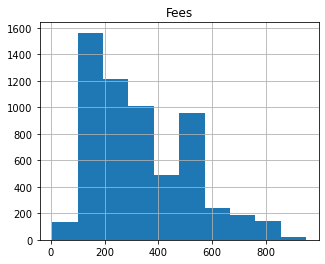

In [52]:
Train.hist(figsize=(5,4));

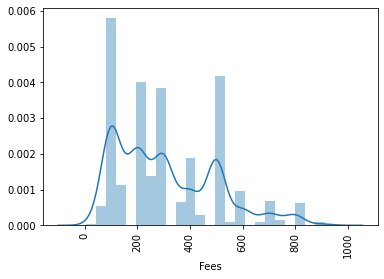

In [53]:
for i in Train.describe().columns:
    sns.distplot(Train[i])
    plt.xticks(rotation=90)
    plt.show()

In [54]:
Train.Profile.value_counts()

Dentist             1397
General Medicine    1173
Dermatologists      1034
Homeopath            843
Ayurveda             786
ENT Specialist       728
Name: Profile, dtype: int64

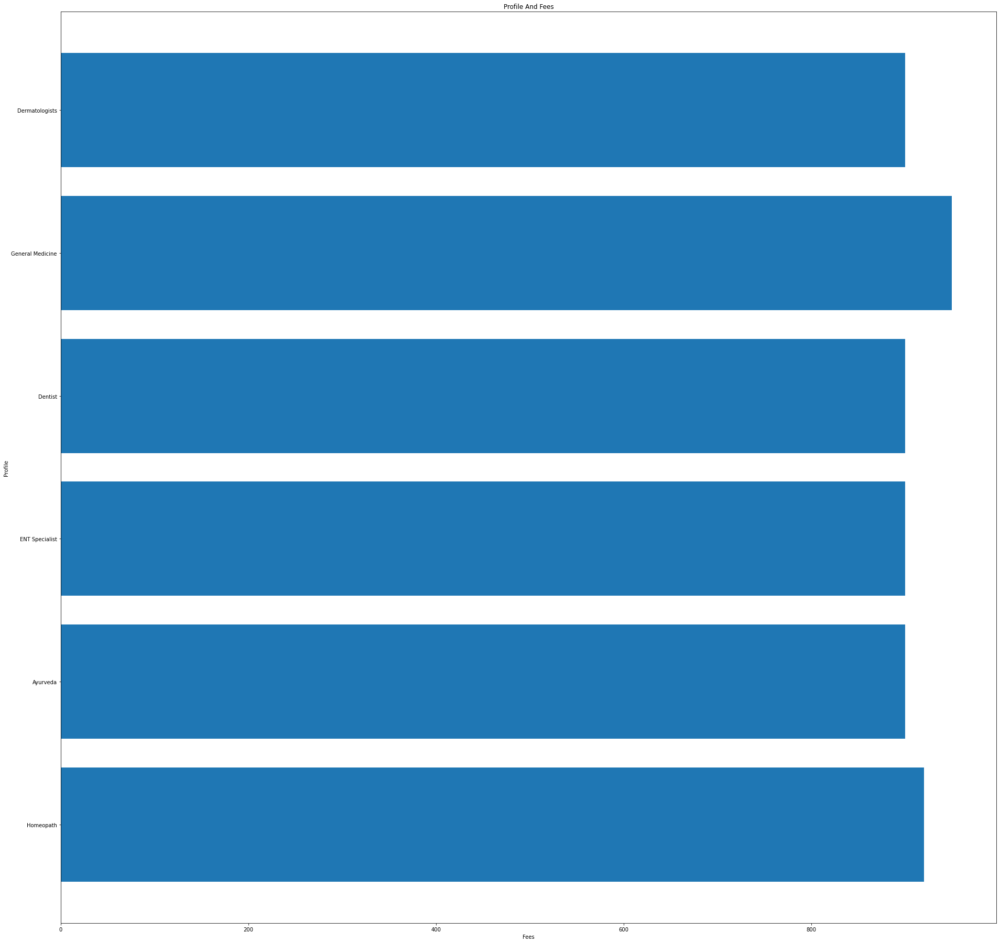

In [55]:
plt.figure(figsize=(32,32))
plt.barh(Train['Profile'],Train['Fees'])
plt.title('Profile And Fees')
plt.xlabel('Fees')
plt.ylabel('Profile')
plt.show()

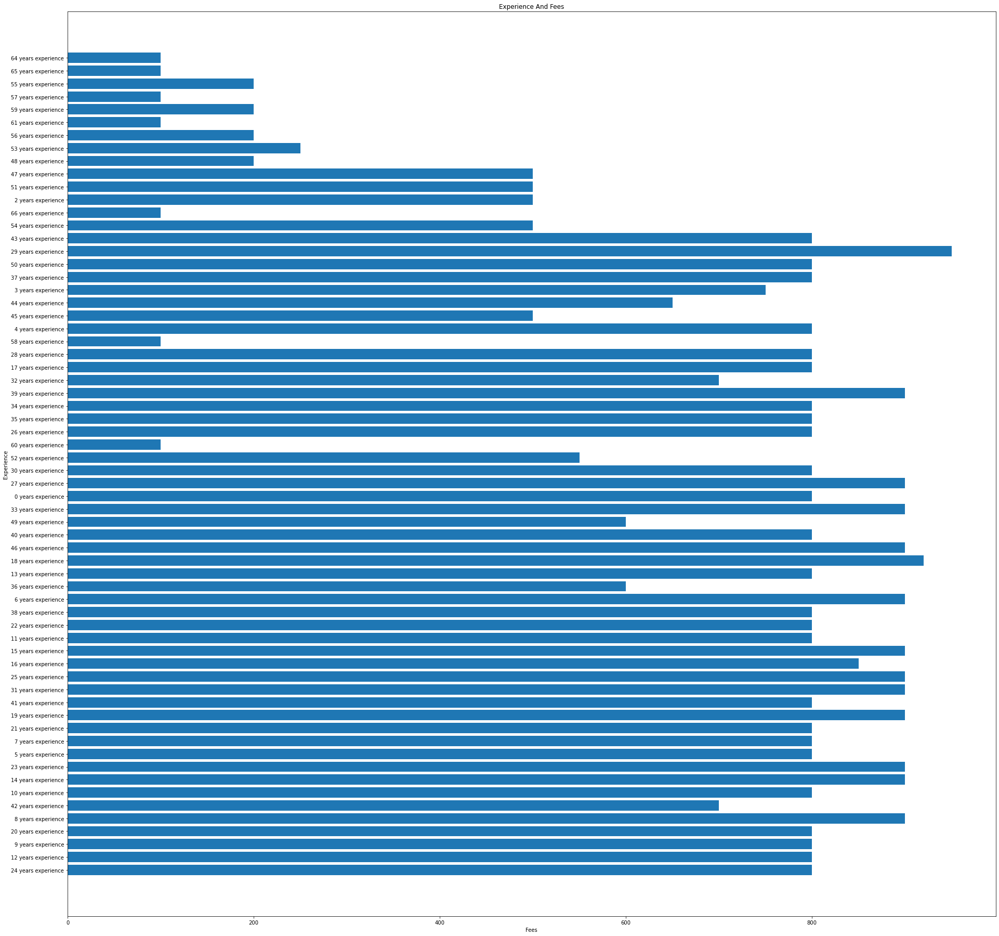

In [56]:
plt.figure(figsize=(32,32))
plt.barh(Train['Experience'],Train['Fees'])
plt.title('Experience And Fees')
plt.xlabel('Fees')
plt.ylabel('Experience ')
plt.show()

(array([   0,    1,    2, ..., 1417, 1418, 1419]),
 <a list of 1420 Text major ticklabel objects>)

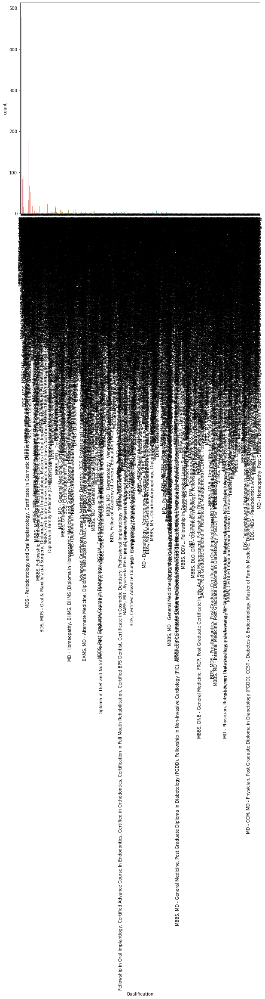

In [57]:
plt.figure(figsize=(10,9))
sns.countplot(Train.Qualification)
plt.xticks(rotation=90)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]),
 <a list of 64 Text major ticklabel objects>)

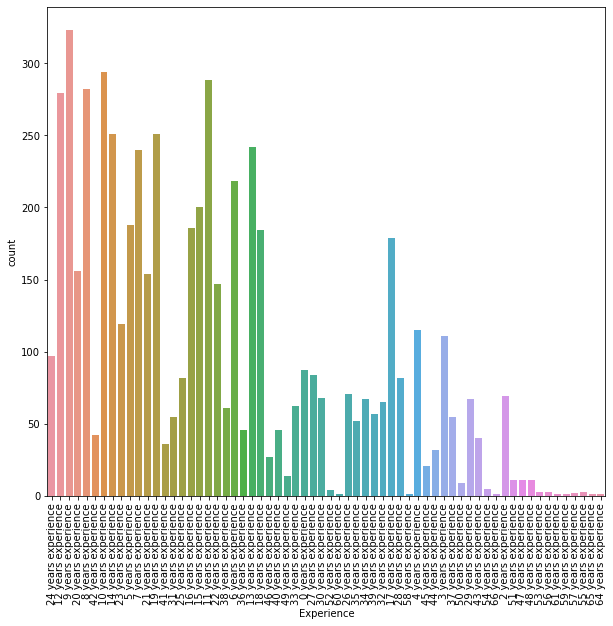

In [58]:
plt.figure(figsize=(10,9))
sns.countplot(Train.Experience)
plt.xticks(rotation=90)

(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
        104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
        117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
        130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
        143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
        156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
        169, 170, 171, 172, 173, 174, 175, 176, 177

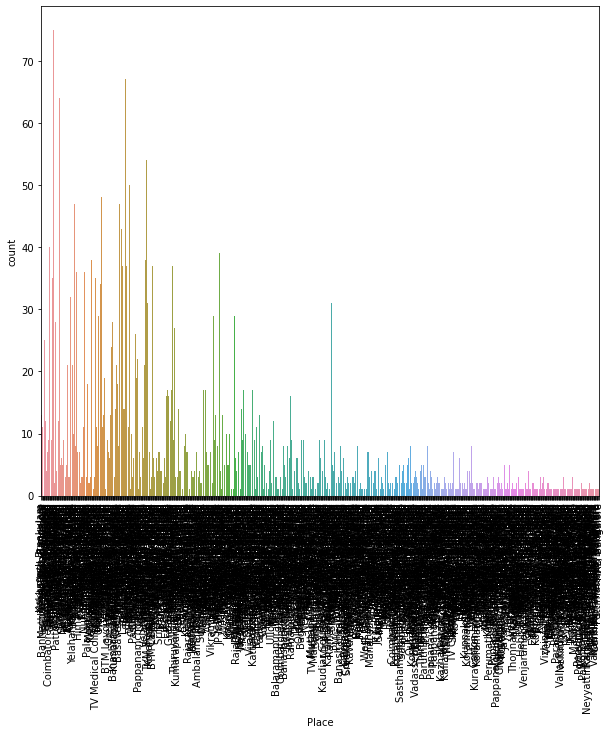

In [59]:
plt.figure(figsize=(10,9))
sns.countplot(Train.Place)
plt.xticks(rotation=90)

(array([0, 1, 2, 3, 4, 5]), <a list of 6 Text major ticklabel objects>)

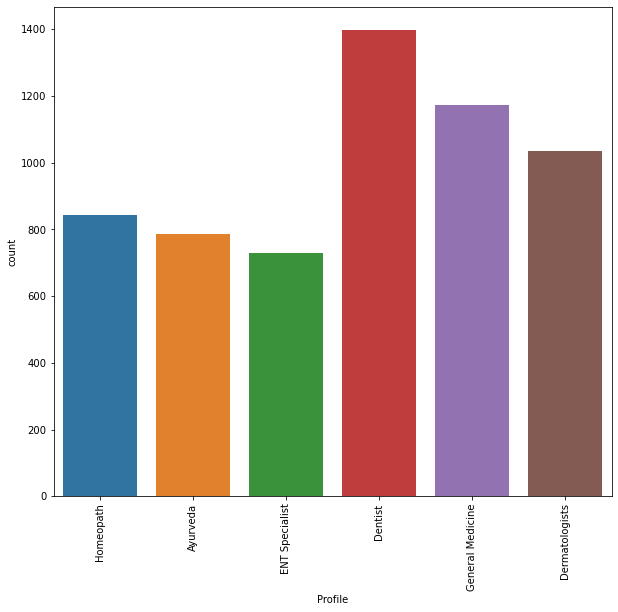

In [60]:
plt.figure(figsize=(10,9))
sns.countplot(Train.Profile)
plt.xticks(rotation=90)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]),
 <a list of 51 Text major ticklabel objects>)

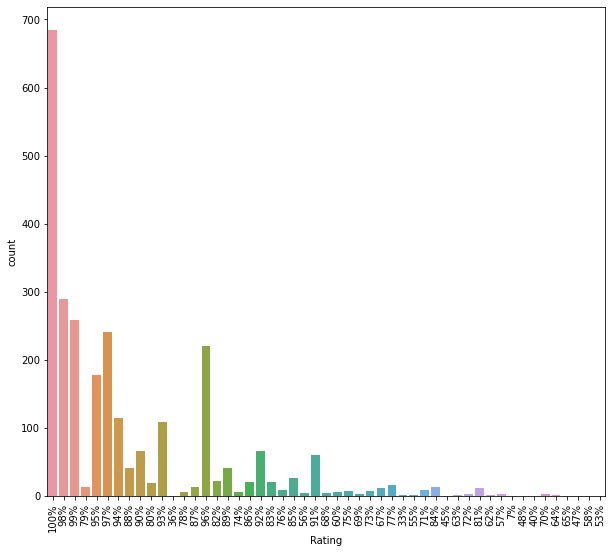

In [61]:
plt.figure(figsize=(10,9))
sns.countplot(Train.Rating)
plt.xticks(rotation=90)

In [62]:
Train.style.background_gradient(cmap='Reds')

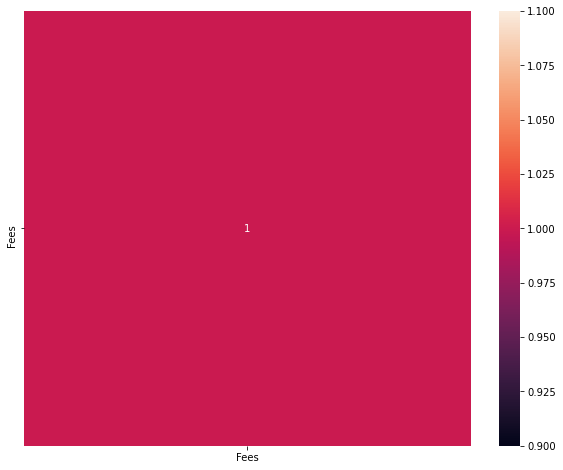

In [63]:
plt.figure(figsize=(10,8))
sns.heatmap(Train.corr(),annot=True,vmax=1)
plt.show()

In [64]:
label=LabelEncoder()
varib = ['Qualification','Experience','Rating','Place','Profile','Miscellaneous_Info']
for i in varib:
    Train[i]=label.fit_transform(Train[i].astype(str))

Train

,Qualification,Experience,Rating,Place,Profile,Miscellaneous_Info,Fees
0,401,16,0,299,5,130,100
1,73,3,49,866,0,1422,350
2,1135,63,51,457,3,2992,300
3,464,3,51,68,0,1695,250
4,10,12,0,337,0,253,250
...,...,...,...,...,...,...,...
5956,1075,10,49,70,3,1385,300
5957,596,26,51,541,4,2992,100
5958,596,35,48,216,4,1173,600
5959,943,6,41,850,4,2202,100


In [65]:
Train

,Qualification,Experience,Rating,Place,Profile,Miscellaneous_Info,Fees
0,401,16,0,299,5,130,100
1,73,3,49,866,0,1422,350
2,1135,63,51,457,3,2992,300
3,464,3,51,68,0,1695,250
4,10,12,0,337,0,253,250
...,...,...,...,...,...,...,...
5956,1075,10,49,70,3,1385,300
5957,596,26,51,541,4,2992,100
5958,596,35,48,216,4,1173,600
5959,943,6,41,850,4,2202,100


In [66]:
Train.describe()

,Qualification,Experience,Rating,Place,Profile,Miscellaneous_Info,Fees
count,5961.000000,5961.000000,5961.000000,5961.000000,5961.000000,5961.000000,5961.000000
mean,596.857574,23.010904,42.784768,417.089918,2.441872,2187.359336,307.944640
std,413.842446,20.937163,16.378538,259.983793,1.658014,957.884405,190.920373
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000
25%,219.000000,6.000000,46.000000,197.000000,1.000000,1477.000000,150.000000
50%,596.000000,15.000000,51.000000,412.000000,2.000000,2703.000000,300.000000
75%,943.000000,36.000000,51.000000,632.000000,4.000000,2992.000000,500.000000
max,1419.000000,63.000000,51.000000,877.000000,5.000000,2998.000000,950.000000


In [67]:
Train['Rating'].fillna(Train['Rating'].mean(),inplace=True)
Train['Miscellaneous_Info'].fillna(Train['Miscellaneous_Info'].median(),inplace=True)
Train['Place'].fillna(Train['Place'].median(),inplace=True)

Train                   

,Qualification,Experience,Rating,Place,Profile,Miscellaneous_Info,Fees
0,401,16,0,299,5,130,100
1,73,3,49,866,0,1422,350
2,1135,63,51,457,3,2992,300
3,464,3,51,68,0,1695,250
4,10,12,0,337,0,253,250
...,...,...,...,...,...,...,...
5956,1075,10,49,70,3,1385,300
5957,596,26,51,541,4,2992,100
5958,596,35,48,216,4,1173,600
5959,943,6,41,850,4,2202,100


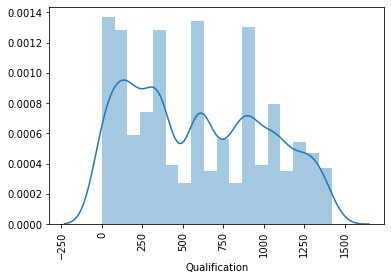

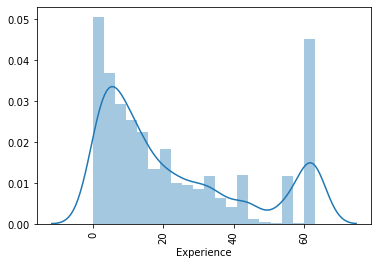

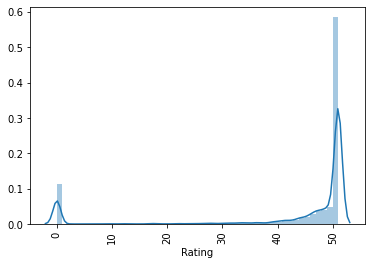

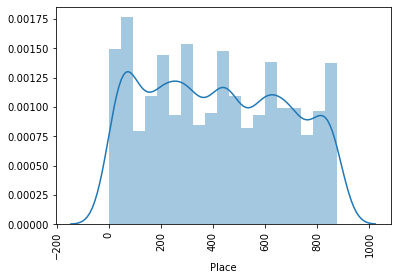

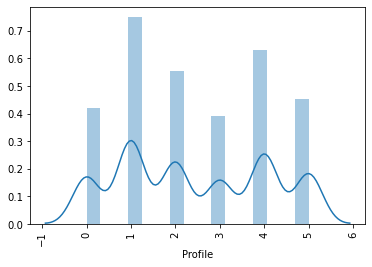

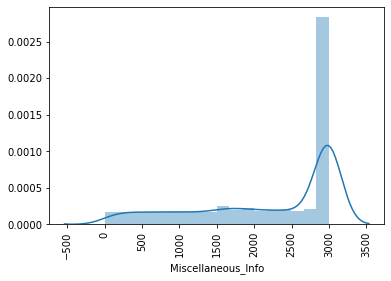

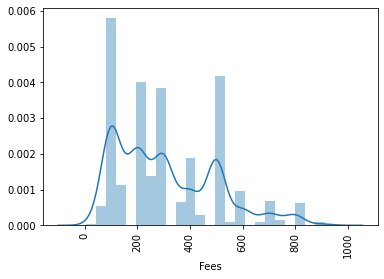

In [68]:
for i in Train.describe().columns:
    sns.distplot(Train[i])
    plt.xticks(rotation=90)
    plt.show()

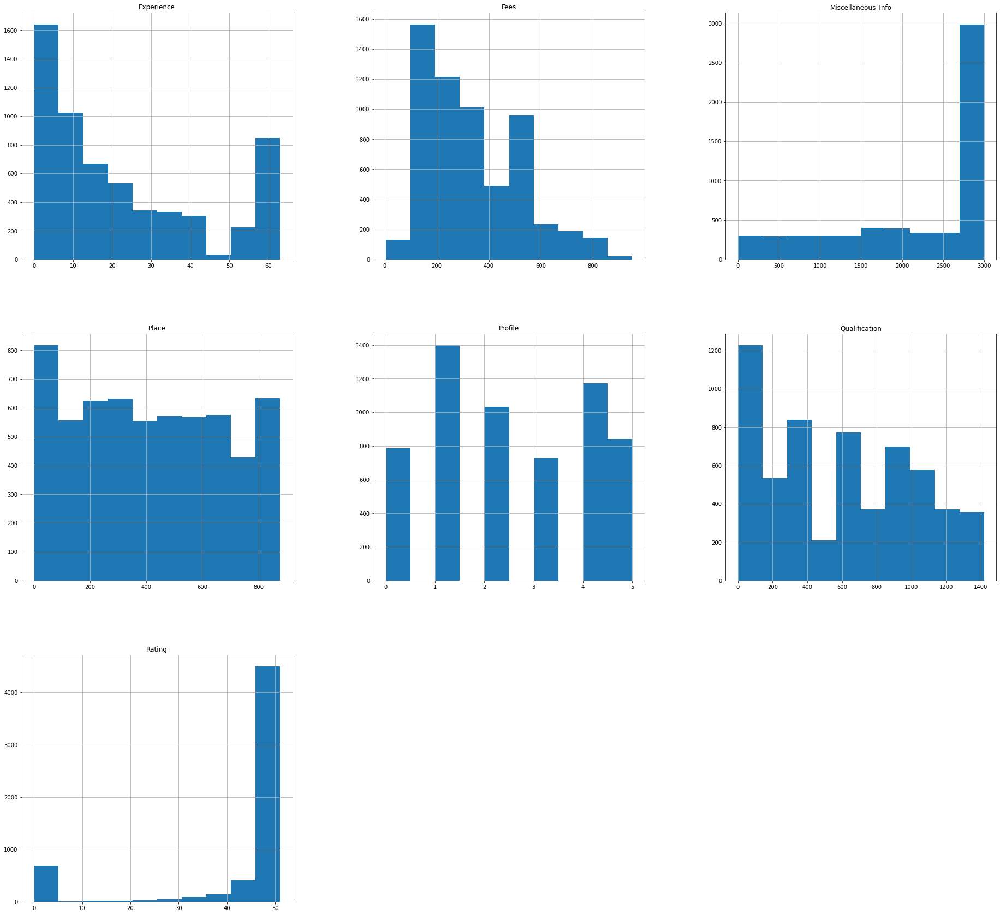

In [69]:
Train.hist(figsize=(32,30));

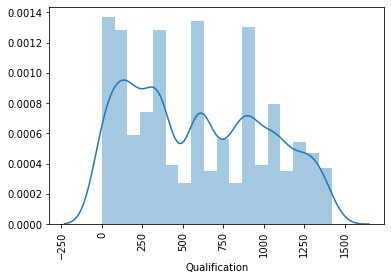

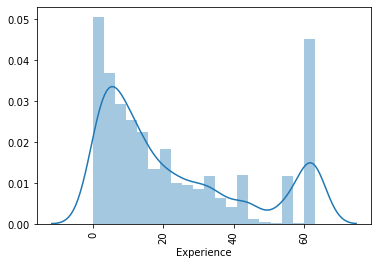

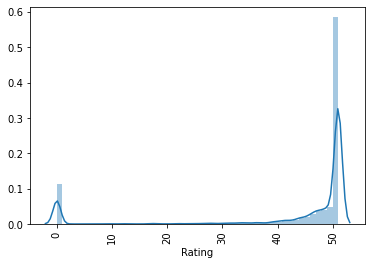

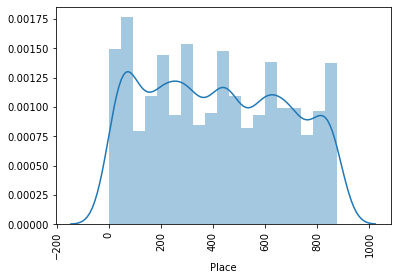

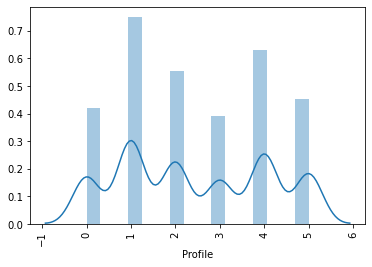

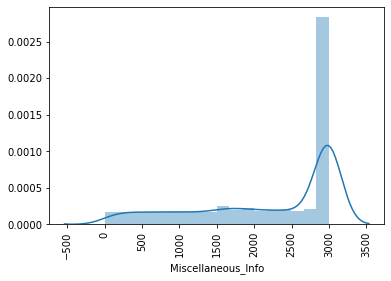

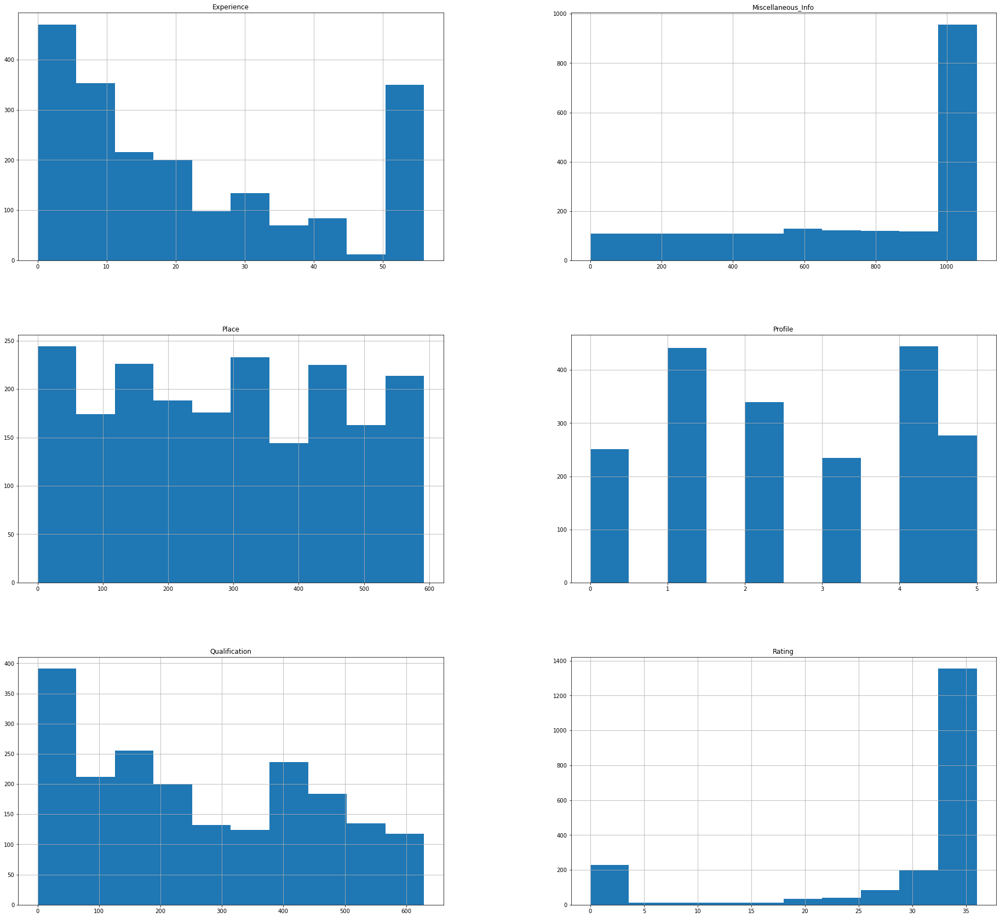

In [70]:
Test.style.background_gradient(cmap='Reds')


label=LabelEncoder()
varib = ['Qualification','Experience','Rating','Place','Profile','Miscellaneous_Info']
for i in varib:
    Test[i]=label.fit_transform(Test[i].astype(str))


Test['Rating'].fillna(Test['Rating'].mean(),inplace=True)
Test['Miscellaneous_Info'].fillna(Test['Miscellaneous_Info'].median(),inplace=True)
Test['Place'].fillna(Test['Place'].median(),inplace=True)

Test                   

for i in Test.describe().columns:
    sns.distplot(Train[i])
    plt.xticks(rotation=90)
    plt.show()

Test.hist(figsize=(32,30));



In [71]:
Test.describe()

,Qualification,Experience,Rating,Place,Profile,Miscellaneous_Info
count,1987.000000,1987.000000,1987.000000,1987.000000,1987.000000,1987.000000
mean,259.979869,21.884248,29.540010,290.621540,2.508807,777.305989
std,185.961177,18.772896,11.725665,174.255446,1.654223,352.832662
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,93.000000,6.000000,30.000000,138.500000,1.000000,494.500000
50%,241.000000,15.000000,36.000000,294.000000,2.000000,941.000000
75%,417.000000,35.000000,36.000000,441.000000,4.000000,1084.000000
max,629.000000,56.000000,36.000000,592.000000,5.000000,1084.000000


In [72]:
Test

,Qualification,Experience,Rating,Place,Profile,Miscellaneous_Info
0,241,28,36,142,4,1084
1,340,24,36,580,3,1084
2,258,34,9,212,2,153
3,6,0,36,374,0,1084
4,79,7,0,231,1,816
...,...,...,...,...,...,...
1982,17,1,36,58,0,1084
1983,548,33,36,96,2,1084
1984,474,56,36,424,4,1084
1985,51,3,34,26,1,975


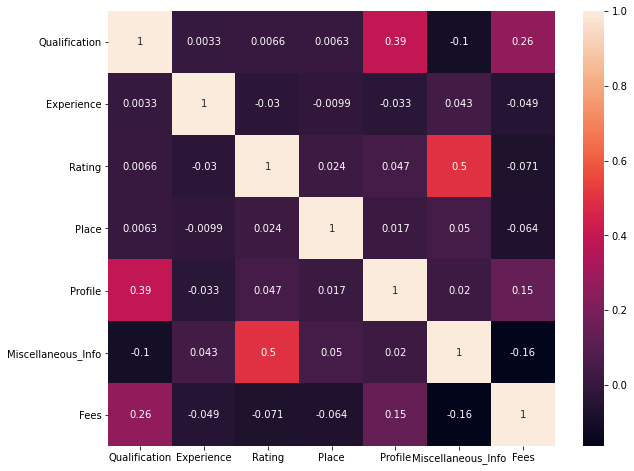

In [73]:
plt.figure(figsize=(10,8))
sns.heatmap(Train.corr(),annot=True,vmax=1)
plt.show()

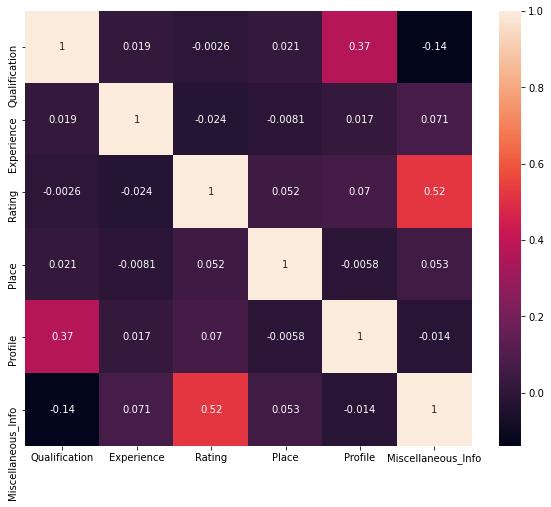

In [74]:
plt.figure(figsize=(10,8))
sns.heatmap(Test.corr(),annot=True,vmax=1)
plt.show()

Text(0.5, 1.0, 'Correlation with target Variable Fees')

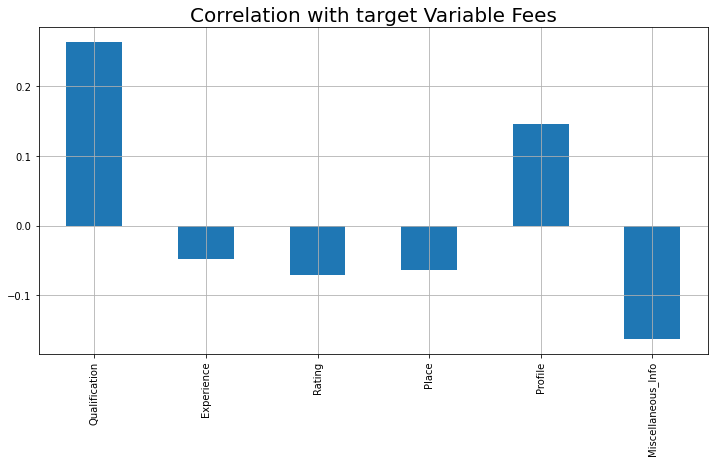

In [75]:
plt.figure(figsize=(12,6))
Train.drop('Fees',axis=1).corrwith(Train['Fees']).plot(kind='bar',grid=True)
plt.xticks(rotation=90)
plt.title("Correlation with target Variable Fees", fontsize=20)

In [76]:
Test['Fees']=Submission['Fees'].values
Test

,Qualification,Experience,Rating,Place,Profile,Miscellaneous_Info,Fees
0,241,28,36,142,4,1084,1747
1,340,24,36,580,3,1084,1725
2,258,34,9,212,2,153,2194
3,6,0,36,374,0,1084,2193
4,79,7,0,231,1,816,2091
...,...,...,...,...,...,...,...
1982,17,1,36,58,0,1084,2352
1983,548,33,36,96,2,1084,1653
1984,474,56,36,424,4,1084,2063
1985,51,3,34,26,1,975,2541


In [77]:
y = Test['Fees']
x = Test.drop('Fees', axis=1)
x = Test.drop('Miscellaneous_Info', axis=1)


In [78]:
x

,Qualification,Experience,Rating,Place,Profile,Fees
0,241,28,36,142,4,1747
1,340,24,36,580,3,1725
2,258,34,9,212,2,2194
3,6,0,36,374,0,2193
4,79,7,0,231,1,2091
...,...,...,...,...,...,...
1982,17,1,36,58,0,2352
1983,548,33,36,96,2,1653
1984,474,56,36,424,4,2063
1985,51,3,34,26,1,2541


In [79]:
x_train, x_test,y_train,y_test=train_test_split(x,y,test_size=0.30)
x.shape

(1987, 6)

In [80]:
import sklearn
from sklearn.metrics import mean_absolute_error, mean_squared_error,explained_variance_score,r2_score,mean_tweedie_deviance

import warnings
warnings.filterwarnings('ignore')

model=[LinearRegression(), Lasso(alpha=1),Ridge(alpha=1),KNeighborsRegressor(),DecisionTreeRegressor(),
      RandomForestRegressor(),AdaBoostRegressor(),GradientBoostingRegressor()]


for m in model:
    m.fit(x_train,y_train)
    m.score(x_train,y_train)
    predm=m.predict(x_test)
    print(' Score = \n',m,'is :')
    print(r2_score(y_test,predm))
    print(explained_variance_score(y_test,predm))
    print(mean_absolute_error(y_test,predm))
    print(mean_squared_error(y_test,predm))
    print(mean_tweedie_deviance(y_test,predm))
    print('\n')

 Score = 
 LinearRegression() is :
1.0
1.0
1.0854522194526154e-13
2.7278255125021325e-26
2.7278255125021325e-26


 Score = 
 Lasso(alpha=1) is :
0.9999999999366502
0.999999999936941
0.0022121851000571906
7.3948048061431255e-06
7.3948048061431255e-06


 Score = 
 Ridge(alpha=1) is :
1.0
1.0
1.6153747506978473e-06
3.91740629607827e-12
3.91740629607827e-12


 Score = 
 KNeighborsRegressor() is :
0.9962930935366757
0.996293134734138
14.92428810720268
432.70626465661655
432.70626465661655


 Score = 
 DecisionTreeRegressor() is :
0.9999374207721442
0.9999390331592282
1.3283082077051926
7.304857621440536
7.304857621440536


 Score = 
 RandomForestRegressor() is :
0.9999793529875335
0.9999804330765707
0.8489447236180923
2.410120603015075
2.410120603015075


 Score = 
 AdaBoostRegressor() is :
0.9971079409481479
0.9971191072437896
15.02366070158838
337.58933004504365
337.58933004504365


 Score = 
 GradientBoostingRegressor() is :
0.9998988929914852
0.9999003479110595
2.4892142349638737
11.802

In [81]:
import joblib
joblib.dump(LinearRegression(),'M20_P13_Doctor_fee_consultation.obj')

['M20_P13_Doctor_fee_consultation.obj']